In [2]:
import os
import glob
import cv2
import tqdm.notebook as tqdm
import multiprocessing as mp
from PIL import Image
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

In [1]:
OUTDIR = '/archive/bioinformatics/DLLab/KevinNguyen/data/melanoma/'
PDX = ['m481', 'm634', 'm498', 'm610'] # PDXs to include in main training dataset
DATES = ['160802', '160808', '161209', '161214', '161220', '161224'] # Dates of acquisition in common across these PDXs

In [82]:
def brightness(im):
    return im.mean()

def contrast_std(im):
    return im.std()

def variance_laplacian(im):
    return cv2.Laplacian(im, cv2.CV_64F).var()

def snr(im):
    return im.mean() / im.std()


In [91]:
def process_cell_dir(strCellDir):
    lsCellImages = glob.glob(os.path.join(strCellDir, '*.png'))
    df = pd.DataFrame(columns=['Path', 'Brightness', 'S.D.', 'VoL', 'SNR'])
    i = 0
    for strImgPath in lsCellImages:
        img = Image.open(strImgPath)
        arrImg = np.array(img)
        df.loc[i] = [strImgPath, brightness(arrImg), contrast_std(arrImg), variance_laplacian(arrImg), snr(arrImg)]
        i += 1
    df['PDX'] = strPDX
    df['Date'] = strDate
    df['Cell'] = os.path.basename(strCellDir)
    return df


lsMetrics = []
for strPDX in PDX:
    print('PDX:', strPDX)
    for strDate in DATES:
        print('Date:', strDate)
        lsCells = glob.glob(f'/archive/bioinformatics/DLLab/KevinNguyen/data/melanoma_hackathon/raw/png/*/{strPDX}/{strDate}*/*')
        with mp.Pool(8) as pool:
            lsMetrics += list(tqdm.tqdm(pool.imap(process_cell_dir, lsCells), total=len(lsCells)))
            
dfMetrics = pd.concat(lsMetrics, axis=0)


PDX: m481
Date: 160802



Date: 160808



Date: 161209



Date: 161214



Date: 161220



Date: 161224



PDX: m634
Date: 160802



Date: 160808



Date: 161209



Date: 161214



Date: 161220



Date: 161224



PDX: m498
Date: 160802



Date: 160808



Date: 161209



Date: 161214



Date: 161220



Date: 161224



PDX: m610
Date: 160802



Date: 160808



Date: 161209



Date: 161214



Date: 161220



Date: 161224


In [93]:
dfMetrics.to_csv('image_attributes.csv')

(0.0, 2.0)

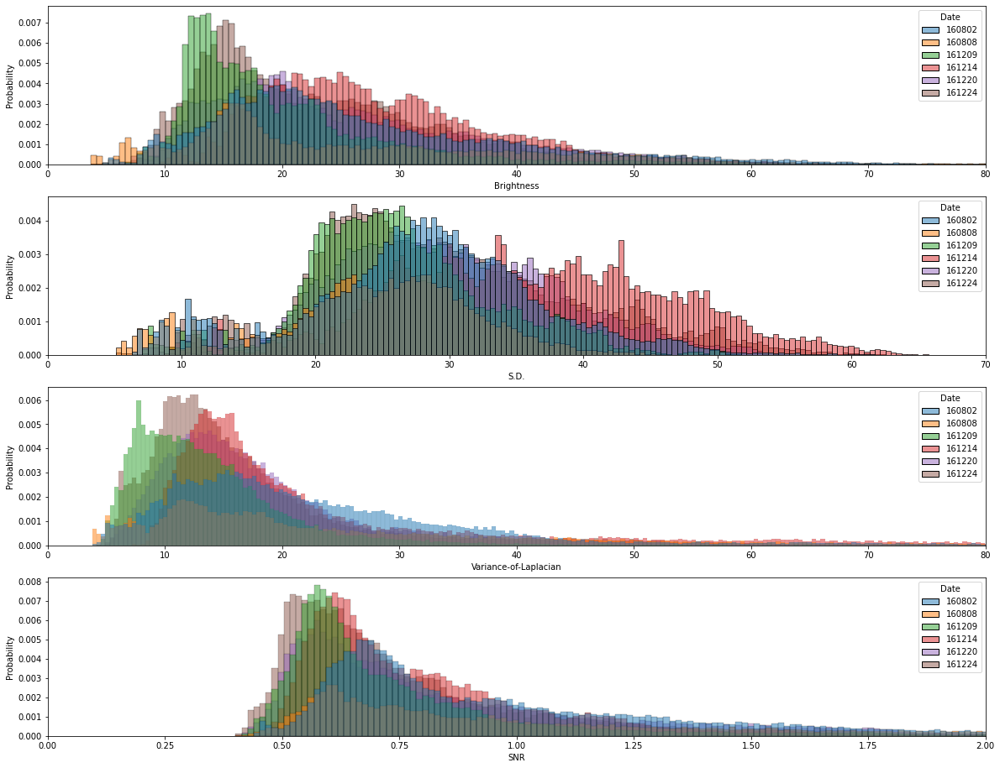

In [103]:
fig, ax = plt.subplots(4, 1, figsize=(20, 16))
sns.histplot(data=dfMetrics, x='Brightness', hue='Date', ax=ax[0], stat='probability')
ax[0].set_xlim(0, 80)
sns.histplot(data=dfMetrics, x='S.D.', hue='Date', ax=ax[1], stat='probability')
ax[1].set_xlim(0, 70)
sns.histplot(data=dfMetrics, x='VoL', hue='Date', ax=ax[2], stat='probability')
ax[2].set_xlabel('Variance-of-Laplacian')
ax[2].set_xlim(0, 80)
sns.histplot(data=dfMetrics, x='SNR', hue='Date', ax=ax[3], stat='probability')
ax[3].set_xlim(0, 2)

In [4]:
dfMetrics= pd.read_csv('image_attributes.csv', index_col=0)

(0.0, 2.0)

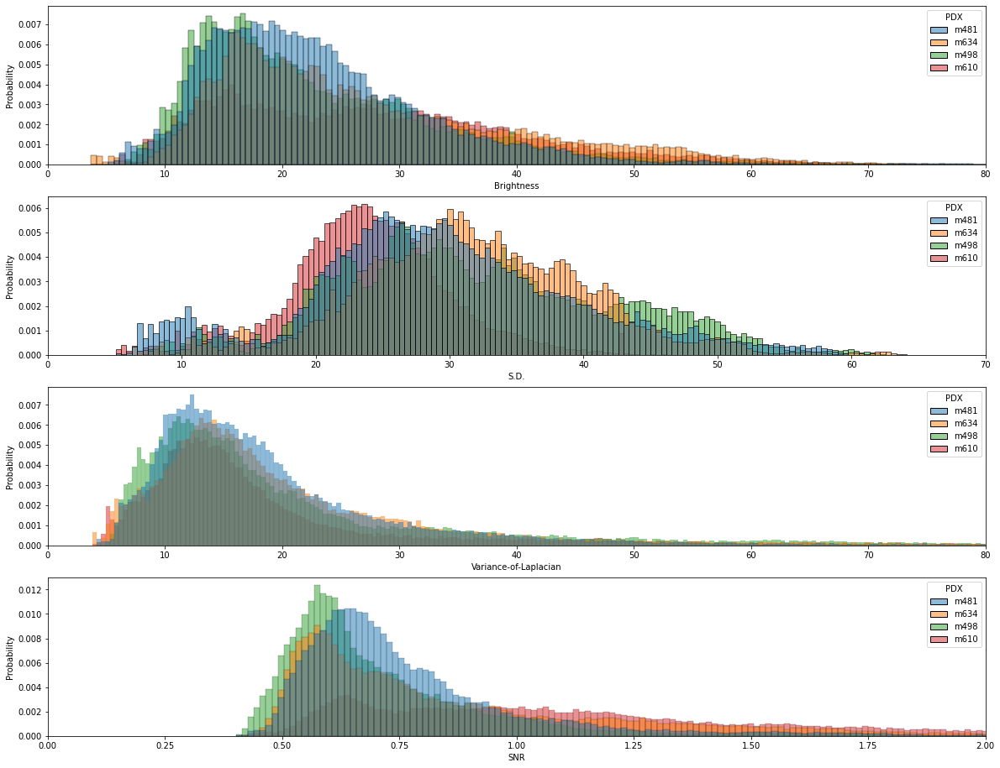

In [5]:
fig, ax = plt.subplots(4, 1, figsize=(20, 16))
sns.histplot(data=dfMetrics, x='Brightness', hue='PDX', ax=ax[0], stat='probability')
ax[0].set_xlim(0, 80)
sns.histplot(data=dfMetrics, x='S.D.', hue='PDX', ax=ax[1], stat='probability')
ax[1].set_xlim(0, 70)
sns.histplot(data=dfMetrics, x='VoL', hue='PDX', ax=ax[2], stat='probability')
ax[2].set_xlabel('Variance-of-Laplacian')
ax[2].set_xlim(0, 80)
sns.histplot(data=dfMetrics, x='SNR', hue='PDX', ax=ax[3], stat='probability')
ax[3].set_xlim(0, 2)